In [1]:
import glob
import sqlite3
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path


##  Read cellProfiler tracking outputs

In [2]:
# read cellProfiler outputs
# dir_path = "./cellpose_cyto_raw_all_segs"
dir_path = "./yuzhong_cellpose_cyto2_segs"
# conn = sqlite3.connect(os.path.join(dir_path, "cb_results_with_mitosis/cell_track.db"))
conn = sqlite3.connect(os.path.join(dir_path, "cell_track.db"))
cell_track_db_df = pd.read_sql_query("SELECT * FROM Per_Object", conn)
relation_df = pd.read_sql_query("SELECT * FROM Per_Relationships", conn)


In [3]:
cell_track_db_df[:2]


,ImageNumber,ObjectNumber,Cell_Number_Object_Number,Cell_AreaShape_Area,Cell_AreaShape_BoundingBoxArea,Cell_AreaShape_BoundingBoxMaximum_X,Cell_AreaShape_BoundingBoxMaximum_Y,Cell_AreaShape_BoundingBoxMinimum_X,Cell_AreaShape_BoundingBoxMinimum_Y,Cell_AreaShape_Center_X,...,Cell_TrackObjects_LinkingDistance,Cell_TrackObjects_MergeScore,Cell_TrackObjects_MitosisScore,Cell_TrackObjects_MovementModel,Cell_TrackObjects_ParentImageNumber,Cell_TrackObjects_ParentObjectNumber,Cell_TrackObjects_SplitScore,Cell_TrackObjects_StandardDeviation,Cell_TrackObjects_TrajectoryX,Cell_TrackObjects_TrajectoryY
0,1,1,1,18034.0,24050.0,428.0,581.0,243.0,451.0,329.392924,...,NaN,None,NaN,-1,0,0,None,NaN,0.0,0.0
1,1,2,2,41236.0,59024.0,1422.0,1559.0,1174.0,1321.0,1296.094238,...,NaN,None,NaN,-1,0,0,None,NaN,0.0,0.0


In [4]:
relation_df[:2]


,relationship_type_id,image_number1,object_number1,image_number2,object_number2
0,1,1,2,2,3
1,1,1,3,2,4


In [5]:
cell_track_db_df.columns


Index(['ImageNumber', 'ObjectNumber', 'Cell_Number_Object_Number',
       'Cell_AreaShape_Area', 'Cell_AreaShape_BoundingBoxArea',
       'Cell_AreaShape_BoundingBoxMaximum_X',
       'Cell_AreaShape_BoundingBoxMaximum_Y',
       'Cell_AreaShape_BoundingBoxMinimum_X',
       'Cell_AreaShape_BoundingBoxMinimum_Y', 'Cell_AreaShape_Center_X',
       'Cell_AreaShape_Center_Y', 'Cell_AreaShape_Compactness',
       'Cell_AreaShape_ConvexArea', 'Cell_AreaShape_Eccentricity',
       'Cell_AreaShape_EquivalentDiameter', 'Cell_AreaShape_EulerNumber',
       'Cell_AreaShape_Extent', 'Cell_AreaShape_FormFactor',
       'Cell_AreaShape_MajorAxisLength', 'Cell_AreaShape_MaxFeretDiameter',
       'Cell_AreaShape_MaximumRadius', 'Cell_AreaShape_MeanRadius',
       'Cell_AreaShape_MedianRadius', 'Cell_AreaShape_MinFeretDiameter',
       'Cell_AreaShape_MinorAxisLength', 'Cell_AreaShape_Orientation',
       'Cell_AreaShape_Perimeter', 'Cell_AreaShape_Solidity',
       'Cell_Location_Center_X', 'Cell_Loc

In [6]:
def generate_traj_df(df):
    """
    Record img_num and obj_num(or idx_num in Per_Object) in all traj into one table, label=rowIndex+1
    Returns
        a tuple of dataframe
    """
    t_span = max(df["ImageNumber"])
    traj_label = df["Cell_TrackObjects_Label"].values
    traj_label = np.sort(np.unique(traj_label[traj_label > 0]))
    num_trajectories = len(traj_label)  # the quantity of trajectories
    print("#trajectories:", num_trajectories)

    t_col = [str(i + 1) for i in range(t_span)]

    # initialize pandas dataframes
    traj_df = -1 * np.ones((num_trajectories, t_span), dtype=np.int)
    traj_df = pd.DataFrame(traj_df, columns=t_col)

    traj_row_idx_df = -1 * np.ones((num_trajectories, t_span), dtype=np.int)
    traj_row_idx_df = pd.DataFrame(traj_row_idx_df, columns=t_col)

    for traj_i in range(num_trajectories):
        cur_traj_label = traj_label[traj_i]
        # find all the index that have the same label(in the same trajectory)
        same_traj_label_indices = df["Cell_TrackObjects_Label"] == int(cur_traj_label)
        row_idx_list = df[same_traj_label_indices].index.tolist()
        for row_idx in row_idx_list:
            time_index = df["ImageNumber"][row_idx]
            traj_df[str(time_index)][traj_i] = df["ObjectNumber"][row_idx]
            traj_row_idx_df[str(time_index)][traj_i] = row_idx
    return traj_df, traj_row_idx_df


In [7]:
traj_labels = cell_track_db_df["Cell_TrackObjects_Label"].values
traj_labels = np.unique(traj_labels[traj_labels > 0])
traj_labels


array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 18

In [8]:
traj_df, traj_row_idx_df = generate_traj_df(cell_track_db_df)
traj_df.insert(loc=0, column="traj_label", value=traj_labels)
traj_df


#trajectories: 227


C:\Users\dummy\AppData\Local\Temp\ipykernel_25420\2197277454.py:16: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  traj_df = -1 * np.ones((num_trajectories, t_span), dtype=np.int)
C:\Users\dummy\AppData\Local\Temp\ipykernel_25420\2197277454.py:19: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your curr

,traj_label,1,2,3,4,5,6,7,8,9,...,111,112,113,114,115,116,117,118,119,120
0,1,1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
1,2,2,3,-1,-1,3,3,5,6,6,...,4,4,4,4,4,4,4,6,5,4
2,3,3,4,4,7,4,4,6,8,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
3,4,4,-1,-1,-1,5,7,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
4,5,5,5,6,9,6,8,9,10,8,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222,223,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,6,-1,-1,-1,-1
223,224,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,4,-1,-1
224,225,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,8,7,6
225,226,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,9,-1,7


In [9]:
traj_row_idx_df


,1,2,3,4,5,6,7,8,9,10,...,111,112,113,114,115,116,117,118,119,120
0,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
1,1,9,-1,-1,38,47,59,71,83,96,...,1016,1025,1033,1037,1044,1049,1056,1064,1073,1081
2,2,10,18,30,39,48,60,73,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
3,3,-1,-1,-1,40,51,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
4,4,11,20,32,41,52,63,75,85,100,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,1051,-1,-1,-1,-1
223,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,1062,-1,-1
224,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,1066,1075,1083
225,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,1067,-1,1084


In [10]:
cell_track_db_df[:2]


,ImageNumber,ObjectNumber,Cell_Number_Object_Number,Cell_AreaShape_Area,Cell_AreaShape_BoundingBoxArea,Cell_AreaShape_BoundingBoxMaximum_X,Cell_AreaShape_BoundingBoxMaximum_Y,Cell_AreaShape_BoundingBoxMinimum_X,Cell_AreaShape_BoundingBoxMinimum_Y,Cell_AreaShape_Center_X,...,Cell_TrackObjects_LinkingDistance,Cell_TrackObjects_MergeScore,Cell_TrackObjects_MitosisScore,Cell_TrackObjects_MovementModel,Cell_TrackObjects_ParentImageNumber,Cell_TrackObjects_ParentObjectNumber,Cell_TrackObjects_SplitScore,Cell_TrackObjects_StandardDeviation,Cell_TrackObjects_TrajectoryX,Cell_TrackObjects_TrajectoryY
0,1,1,1,18034.0,24050.0,428.0,581.0,243.0,451.0,329.392924,...,NaN,None,NaN,-1,0,0,None,NaN,0.0,0.0
1,1,2,2,41236.0,59024.0,1422.0,1559.0,1174.0,1321.0,1296.094238,...,NaN,None,NaN,-1,0,0,None,NaN,0.0,0.0


Define constants for column/variable name abstraction  
[todo] write in a class as class static variables

In [11]:
MAX_X_COL = "Cell_AreaShape_BoundingBoxMaximum_X"
MAX_Y_COL = "Cell_AreaShape_BoundingBoxMaximum_Y"
MIN_X_COL = "Cell_AreaShape_BoundingBoxMinimum_X"
MIN_Y_COL = "Cell_AreaShape_BoundingBoxMinimum_Y"
AREA_CENTER_X = "Cell_AreaShape_Center_X"
AREA_CENTER_Y = "Cell_AreaShape_Center_Y"
IMG_NUM_COL = "ImageNumber"

TRAJ_MISSING_INDEX = -1

max_xs = cell_track_db_df[MAX_X_COL]
max_ys = cell_track_db_df[MAX_Y_COL]
min_xs = cell_track_db_df[MIN_X_COL]
min_ys = cell_track_db_df[MIN_Y_COL]


## Read and Visualize Trajectories

In [12]:
from cellpose.io import imread
from pathlib import Path
import livecell_segment.datasets
import glob

dir_path = Path(
    "D:\\xing-vimentin-dic-pipeline\\src\\cxa_segmentation\\cxa-data\\june_2022_data\\day0_Notreat_Group1_wellA1_RI_MIP_stitched"
)
imgs = livecell_segment.datasets.LiveCellImageDataset(dir_path, ext="tif")


120 tif img file paths loaded: 


skipping traj: 0
----> visualizing trajectory...
#trajectory nonzero frames: 118


MovieWriter ffmpeg unavailable; using Pillow instead.


saving to: raw_yuzhong_cellprofiler\traj_1.gif...
----> visualizing trajectory...
#trajectory nonzero frames: 8


MovieWriter ffmpeg unavailable; using Pillow instead.


saving to: raw_yuzhong_cellprofiler\traj_2.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 3
----> visualizing trajectory...
#trajectory nonzero frames: 45
saving to: raw_yuzhong_cellprofiler\traj_4.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


----> visualizing trajectory...
#trajectory nonzero frames: 25
saving to: raw_yuzhong_cellprofiler\traj_5.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


----> visualizing trajectory...
#trajectory nonzero frames: 5
saving to: raw_yuzhong_cellprofiler\traj_6.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 7
skipping traj: 8
----> visualizing trajectory...
#trajectory nonzero frames: 29
saving to: raw_yuzhong_cellprofiler\traj_9.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


----> visualizing trajectory...
#trajectory nonzero frames: 56
saving to: raw_yuzhong_cellprofiler\traj_10.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 11
----> visualizing trajectory...
#trajectory nonzero frames: 33
saving to: raw_yuzhong_cellprofiler\traj_12.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 13
skipping traj: 14
skipping traj: 15
----> visualizing trajectory...
#trajectory nonzero frames: 6
saving to: raw_yuzhong_cellprofiler\traj_16.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


----> visualizing trajectory...
#trajectory nonzero frames: 13
saving to: raw_yuzhong_cellprofiler\traj_17.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


----> visualizing trajectory...
#trajectory nonzero frames: 6
saving to: raw_yuzhong_cellprofiler\traj_18.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 19
skipping traj: 20
skipping traj: 21
skipping traj: 22
skipping traj: 23
skipping traj: 24
skipping traj: 25
skipping traj: 26
----> visualizing trajectory...
#trajectory nonzero frames: 5
saving to: raw_yuzhong_cellprofiler\traj_27.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


----> visualizing trajectory...
#trajectory nonzero frames: 7
saving to: raw_yuzhong_cellprofiler\traj_28.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 29
skipping traj: 30
----> visualizing trajectory...
#trajectory nonzero frames: 56
saving to: raw_yuzhong_cellprofiler\traj_31.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 32
----> visualizing trajectory...
#trajectory nonzero frames: 12
saving to: raw_yuzhong_cellprofiler\traj_33.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 34
skipping traj: 35
skipping traj: 36
skipping traj: 37
skipping traj: 38
skipping traj: 39
skipping traj: 40
skipping traj: 41
----> visualizing trajectory...
#trajectory nonzero frames: 5
saving to: raw_yuzhong_cellprofiler\traj_42.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 43
----> visualizing trajectory...
#trajectory nonzero frames: 78
saving to: raw_yuzhong_cellprofiler\traj_44.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 45
skipping traj: 46
----> visualizing trajectory...
#trajectory nonzero frames: 30
saving to: raw_yuzhong_cellprofiler\traj_47.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 48
skipping traj: 49
skipping traj: 50
skipping traj: 51
skipping traj: 52
skipping traj: 53
skipping traj: 54
skipping traj: 55
----> visualizing trajectory...
#trajectory nonzero frames: 6
saving to: raw_yuzhong_cellprofiler\traj_56.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 57
skipping traj: 58
skipping traj: 59
skipping traj: 60
skipping traj: 61
----> visualizing trajectory...
#trajectory nonzero frames: 6
saving to: raw_yuzhong_cellprofiler\traj_62.gif...


C:\Users\dummy\AppData\Local\Temp\ipykernel_25420\1659561952.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()
MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 63
skipping traj: 64
----> visualizing trajectory...
#trajectory nonzero frames: 5
saving to: raw_yuzhong_cellprofiler\traj_65.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 66
skipping traj: 67
skipping traj: 68
skipping traj: 69
skipping traj: 70
skipping traj: 71
skipping traj: 72
skipping traj: 73
skipping traj: 74
skipping traj: 75
skipping traj: 76
skipping traj: 77
skipping traj: 78
skipping traj: 79
----> visualizing trajectory...
#trajectory nonzero frames: 8
saving to: raw_yuzhong_cellprofiler\traj_80.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 81
skipping traj: 82
skipping traj: 83
skipping traj: 84
skipping traj: 85
skipping traj: 86
skipping traj: 87
----> visualizing trajectory...
#trajectory nonzero frames: 10
saving to: raw_yuzhong_cellprofiler\traj_88.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


----> visualizing trajectory...
#trajectory nonzero frames: 6
saving to: raw_yuzhong_cellprofiler\traj_89.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 90
skipping traj: 91
skipping traj: 92
skipping traj: 93
skipping traj: 94
----> visualizing trajectory...
#trajectory nonzero frames: 5
saving to: raw_yuzhong_cellprofiler\traj_95.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 96
----> visualizing trajectory...
#trajectory nonzero frames: 8
saving to: raw_yuzhong_cellprofiler\traj_97.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 98
----> visualizing trajectory...
#trajectory nonzero frames: 8
saving to: raw_yuzhong_cellprofiler\traj_99.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 100
----> visualizing trajectory...
#trajectory nonzero frames: 21
saving to: raw_yuzhong_cellprofiler\traj_101.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 102
skipping traj: 103
skipping traj: 104
----> visualizing trajectory...
#trajectory nonzero frames: 5
saving to: raw_yuzhong_cellprofiler\traj_105.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


----> visualizing trajectory...
#trajectory nonzero frames: 6
saving to: raw_yuzhong_cellprofiler\traj_106.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


----> visualizing trajectory...
#trajectory nonzero frames: 32
saving to: raw_yuzhong_cellprofiler\traj_107.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


----> visualizing trajectory...
#trajectory nonzero frames: 11
saving to: raw_yuzhong_cellprofiler\traj_108.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 109
skipping traj: 110
skipping traj: 111
skipping traj: 112
skipping traj: 113
skipping traj: 114
skipping traj: 115
skipping traj: 116
skipping traj: 117
skipping traj: 118
skipping traj: 119
skipping traj: 120
skipping traj: 121
skipping traj: 122
skipping traj: 123
skipping traj: 124
skipping traj: 125
skipping traj: 126
skipping traj: 127
skipping traj: 128
skipping traj: 129
----> visualizing trajectory...
#trajectory nonzero frames: 18
saving to: raw_yuzhong_cellprofiler\traj_130.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 131
skipping traj: 132
skipping traj: 133
skipping traj: 134
skipping traj: 135
----> visualizing trajectory...
#trajectory nonzero frames: 11
saving to: raw_yuzhong_cellprofiler\traj_136.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 137
----> visualizing trajectory...
#trajectory nonzero frames: 11
saving to: raw_yuzhong_cellprofiler\traj_138.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 139
skipping traj: 140
skipping traj: 141
skipping traj: 142
skipping traj: 143
skipping traj: 144
skipping traj: 145
skipping traj: 146
skipping traj: 147
skipping traj: 148
skipping traj: 149
skipping traj: 150
skipping traj: 151
skipping traj: 152
skipping traj: 153
skipping traj: 154
----> visualizing trajectory...
#trajectory nonzero frames: 5
saving to: raw_yuzhong_cellprofiler\traj_155.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


----> visualizing trajectory...
#trajectory nonzero frames: 10
saving to: raw_yuzhong_cellprofiler\traj_156.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 157
skipping traj: 158
skipping traj: 159
skipping traj: 160
skipping traj: 161
skipping traj: 162
skipping traj: 163
skipping traj: 164
skipping traj: 165
skipping traj: 166
skipping traj: 167
----> visualizing trajectory...
#trajectory nonzero frames: 10
saving to: raw_yuzhong_cellprofiler\traj_168.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 169
----> visualizing trajectory...
#trajectory nonzero frames: 23
saving to: raw_yuzhong_cellprofiler\traj_170.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 171
skipping traj: 172
skipping traj: 173
skipping traj: 174
skipping traj: 175
skipping traj: 176
skipping traj: 177
skipping traj: 178
----> visualizing trajectory...
#trajectory nonzero frames: 16
saving to: raw_yuzhong_cellprofiler\traj_179.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 180
skipping traj: 181
skipping traj: 182
skipping traj: 183
skipping traj: 184
skipping traj: 185
skipping traj: 186
skipping traj: 187
----> visualizing trajectory...
#trajectory nonzero frames: 12
saving to: raw_yuzhong_cellprofiler\traj_188.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


skipping traj: 189
skipping traj: 190
skipping traj: 191
skipping traj: 192
skipping traj: 193
skipping traj: 194
skipping traj: 195
skipping traj: 196
skipping traj: 197
skipping traj: 198
skipping traj: 199
skipping traj: 200
skipping traj: 201
skipping traj: 202
skipping traj: 203
skipping traj: 204
skipping traj: 205
skipping traj: 206
skipping traj: 207
skipping traj: 208
skipping traj: 209
skipping traj: 210
skipping traj: 211
skipping traj: 212
skipping traj: 213
skipping traj: 214
skipping traj: 215
skipping traj: 216
skipping traj: 217
skipping traj: 218
----> visualizing trajectory...
#trajectory nonzero frames: 7
saving to: raw_yuzhong_cellprofiler\traj_219.gif...


MovieWriter ffmpeg unavailable; using Pillow instead.


----> visualizing trajectory...
#trajectory nonzero frames: 5
saving to: raw_yuzhong_cellprofiler\traj_220.gif...
skipping traj: 221
skipping traj: 222
skipping traj: 223
skipping traj: 224
skipping traj: 225
skipping traj: 226


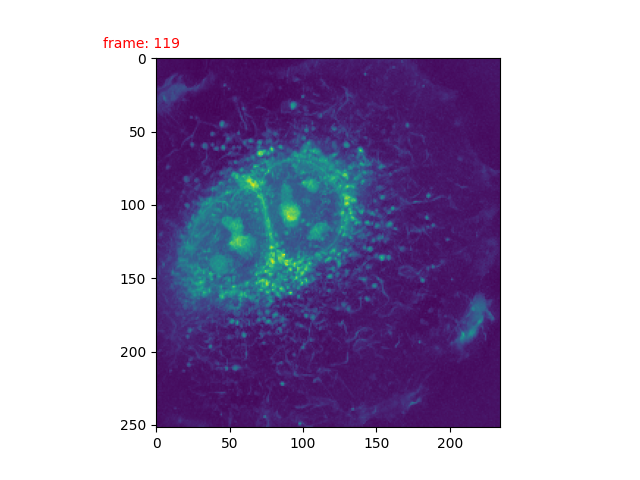

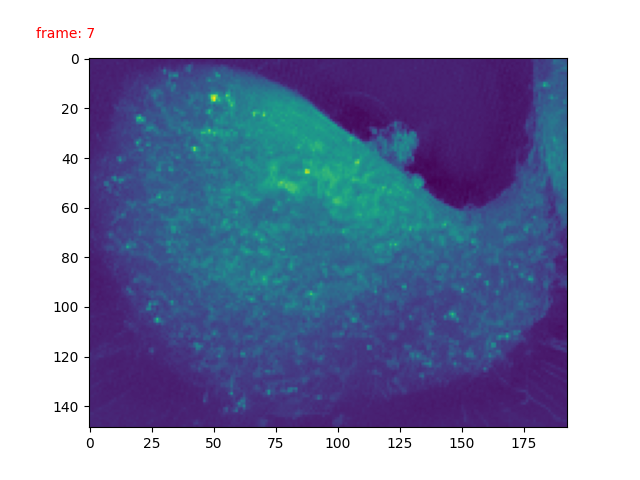

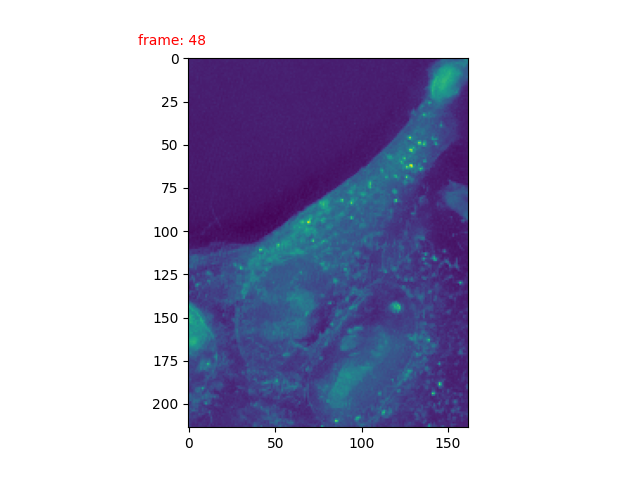

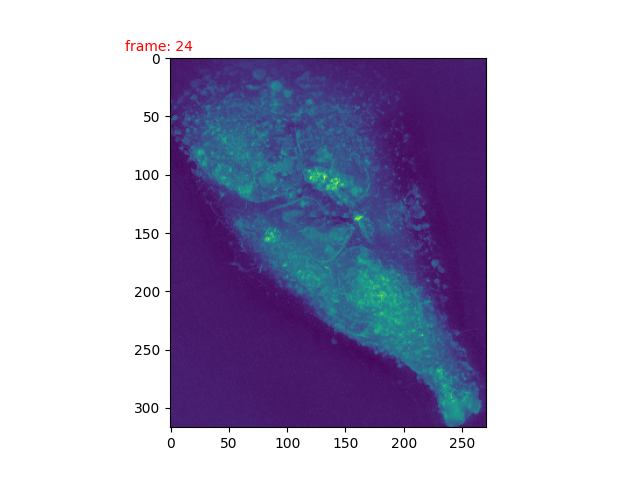

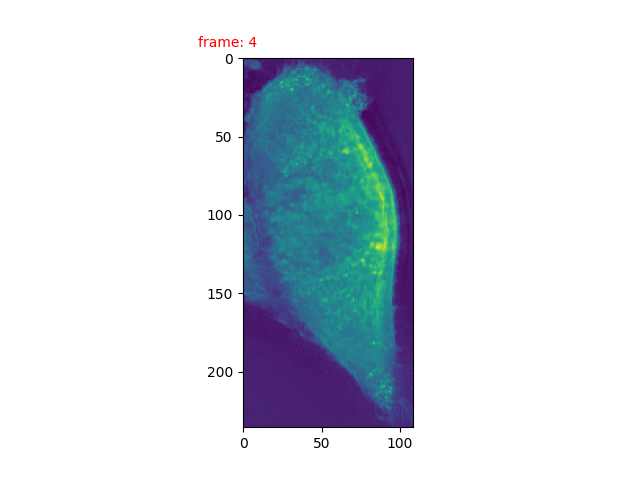

...

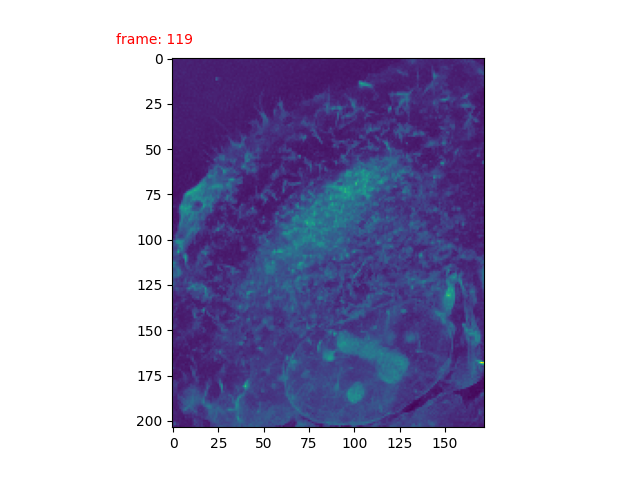

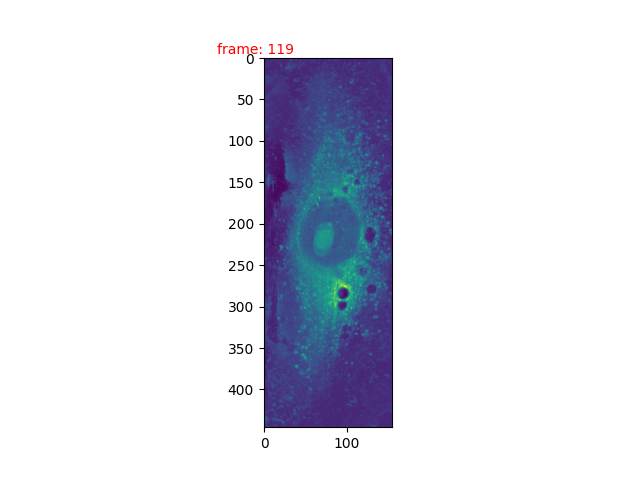

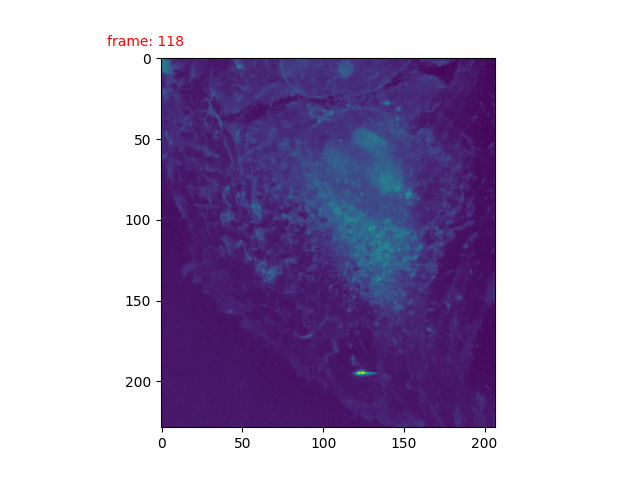

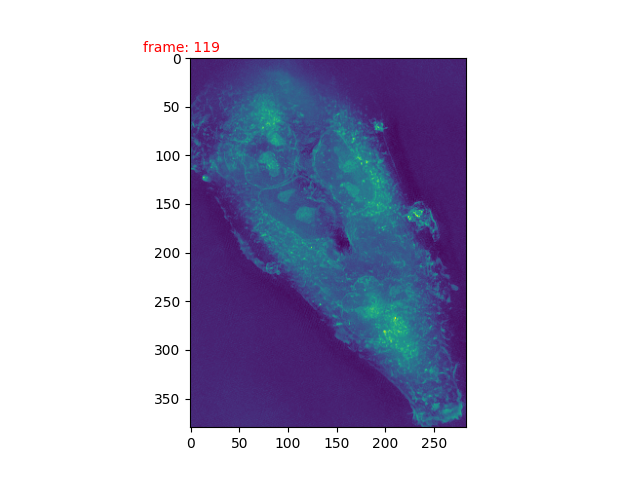

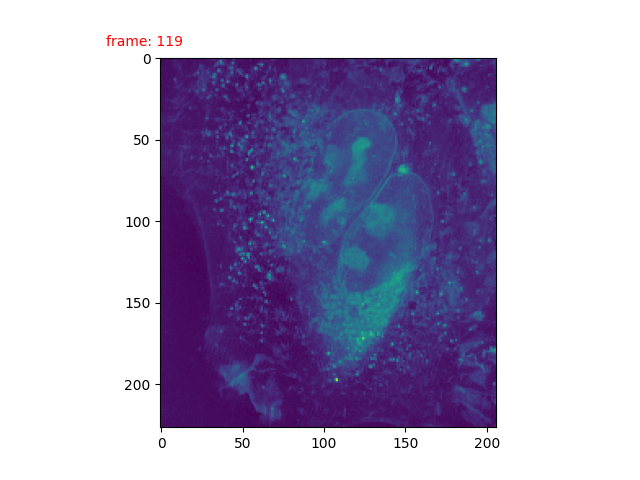

In [13]:
# for interactive display in visual studio code or jupyter notebook
%matplotlib ipympl

%mkdir raw_yuzhong_cellprofiler
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import matplotlib

def count_traj_existing_indices(traj_row_indices, nonexisting_ind=TRAJ_MISSING_INDEX):
    non_zero_traj_count = len([i for i in range(len(traj_row_indices)) if traj_row_indices[i] != nonexisting_ind])
    return non_zero_traj_count


def visualize_traj(traj_row_indices, imgs, cell_track_db_df, save_path="./test.gif"):
    """visualize trajectory by matlpotlib animation and save to a gif file

    Parameters
    ----------
    traj_row_indices : _type_
        a list of row indices in cell_track_db_df
    imgs : _type_
        _description_
    cell_track_db_df : _type_
        _description_
    save_path : str, optional
        _description_, by default "./test.gif"

    Returns
    -------
    _type_
        _description_
    """    
    print("----> visualizing trajectory...")
    non_zero_traj_count = count_traj_existing_indices(traj_row_indices)
    print("#trajectory nonzero frames:", non_zero_traj_count)

    fig, ax = plt.subplots()
    def init():
        return []

    def update(frame):
        frame_idx, frame_img = frame
        ax.cla()
        frame_text = ax.text(-10, -10, "frame: {}".format(frame_idx), fontsize=10, color="red", ha="center", va="center")
        ax.imshow(frame_img)
        
        
        return []

    frame_data = []
    counter = 1
    for frame_idx, row_idx in enumerate(traj_row_indices):
        # the cell maybe missing in the current frame
        if row_idx == TRAJ_MISSING_INDEX:
            continue

        max_x = cell_track_db_df[MAX_X_COL][row_idx]
        max_y = cell_track_db_df[MAX_Y_COL][row_idx]
        min_x = cell_track_db_df[MIN_X_COL][row_idx]
        min_y = cell_track_db_df[MIN_Y_COL][row_idx]
        
        min_x, max_x, min_y, max_y = int(min_x), int(max_x), int(min_y), int(max_y)

        # Note the index difference here: 1-base for CellProfiler and 0-base for list index
        img_idx = cell_track_db_df[IMG_NUM_COL][row_idx] - 1
        img = imgs[img_idx]

        img_crop = img[min_y:max_y, min_x:max_x]
        frame_data.append((frame_idx, img_crop))

        # # debug prints
        # print("row_index:", row_idx, "frame_idx:", frame_idx, "img_idx:", img_idx)
        # print((min_x, max_x, min_y, max_y))


    ani = FuncAnimation(fig, update, frames=frame_data,
                    init_func=None, blit=True)

    print("saving to: %s..." % save_path)
    ani.save(save_path)

output_dir = Path("./raw_yuzhong_cellprofiler/")
for i in range(traj_row_idx_df.shape[0]):
    temp_traj = traj_row_idx_df.iloc[i, :]
    if count_traj_existing_indices(temp_traj) < 5:
        print("skipping traj:", i)
        continue
    save_path = output_dir/f"traj_{i}.gif"
    visualize_traj(temp_traj, imgs, cell_track_db_df, save_path=save_path)
    # plt.show()